<a href="https://colab.research.google.com/github/yahyaahmedkhann/dog-vision/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 end-to-end multi-class dog breed classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given in an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, want to know what breed of a dog it is.  

## 2. Data

The data we are using is from Kaggle: https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction properties for each dog breed of each test image: https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.  
* There are 120 breeds of dogs. (this means there are 120 different classes)
* There are around 10,000+ images in the training set. (these images have labels)
* There are around 10,000+ images in the test set. (these images have no labels, we are going to predict them)

In [2]:
# Unzip the uploaded data into Google Drive
#!unzip "drive/MyDrive/Projects/dog-vision/dog-breed-identification.zip" -d "drive/MyDrive/Projects/dog-vision/"

### Get our Workspace Ready!

* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU

In [3]:
# Import TensorFlow into Colab
import tensorflow as tf
print("TF version:", tf.__version__)

# Import TensorFlow Hub into Colab
import tensorflow_hub as hub
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSS!!)" if tf.config.list_physical_devices("GPU") else "Not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available (YESSS!!)


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's what we are doing first. Turning our images into Tensors(numerical representations).

Lets's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Projects/dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [5]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

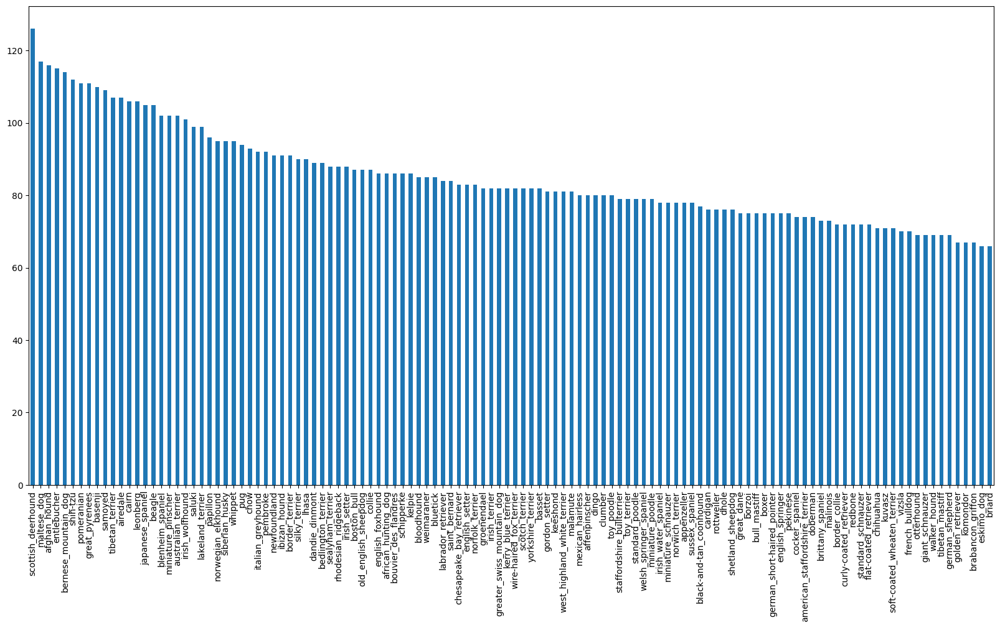

In [6]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10))

In [7]:
labels_csv["breed"].value_counts().median()

82.0

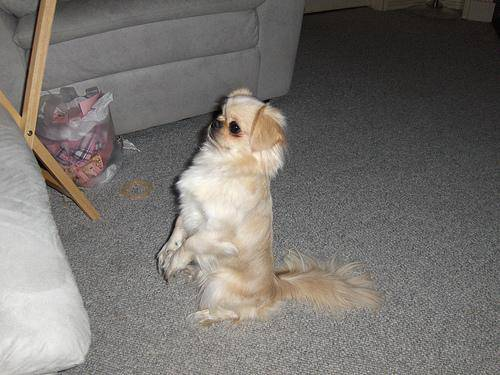

In [8]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Projects/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

### Getting Images and their labels

Let's get a list of all our image file pathnames

In [9]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathnames from ImageID's
filenames = ["drive/MyDrive/Projects/dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Projects/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Projects/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Projects/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Projects/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Projects/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Projects/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Projects/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Projects/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Projects/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Projects/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
  # Check whether number of filenames matches number of actual image files
  import os
  if len(os.listdir("drive/MyDrive/Projects/dog-vision/train/")) == len(filenames):
    print("Filenames match actual amount of files! You may Proceed.")
  else:
    print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files! You may Proceed.


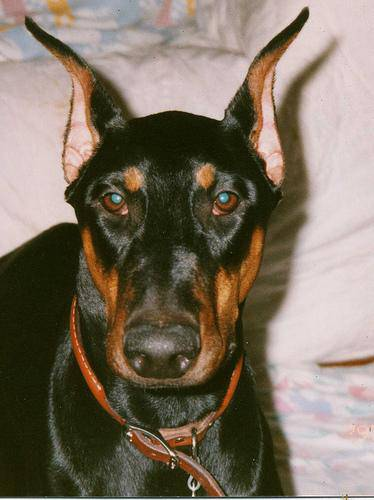

In [12]:
# One more check
Image(filenames[9001])


In [13]:
labels_csv["breed"][9001]

'doberman'

Since we've got our training image filepaths in a list, let's prepare our labels

In [14]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories!")

Number of labels matches number of filenames!


In [17]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [18]:
# Turn a single array into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [19]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [20]:
len(boolean_labels)

10222

In [21]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the same label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
print(labels[45])
print(boolean_labels[45].astype(int))

toy_poodle
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1
 0 0 0 0 0 0 0 0 0]


In [23]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [24]:
filenames[:10]

['drive/MyDrive/Projects/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Projects/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Projects/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Projects/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Projects/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Projects/dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Projects/dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Projects/dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Projects/dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Projects/dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [25]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [26]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed

In [27]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, steps:1000}

In [28]:
# Split the data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [29]:
# Let's look at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Projects/dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Projects/dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Projects/dog-vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Projects/dog-vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Projects/dog-vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

Preprocessing Images (turning Images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors.
4. Resize the `image` to be a shape of (224,224)
5. Return the modified `image`


Let's see what importing an image looks like.

In [30]:
# Convert an image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
image.min(), image.max()

(0, 255)

In [32]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [33]:
# Turn image into sensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

NOw we've seen what an image looks like as a Tensor, Let's make a function to preprocess them

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image
3. Turn our image (a jpg) into Tensors.
4. Normalize our `image`(convert colr channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224,224)
6. Return the modified image




In [34]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing an images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go.. they all might not fit into memory.

That's why we do about 32 (this is the batch size)
images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`.


In [35]:
# Create a function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [36]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Turn our data into Tuples of Tensors in the form: `(image, label)`, Make a function to turn all of our data (x & y) into batches!

In [37]:
# Define the batch size, 32
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X , y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # IF the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))


  # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
  data = data.shuffle(buffer_size=len(X))

  # Create (image, label) tuples (this also turns the image path into a preprocessed image)
  data = data.map(get_image_label)

  # Turn the training data into batches
  data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [38]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [39]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

For better understanding of batches data, Visualize them

In [40]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [41]:
train_images, train_labels = next(train_data.as_numpy_iterator())

len(train_images), len(train_labels)

(32, 32)

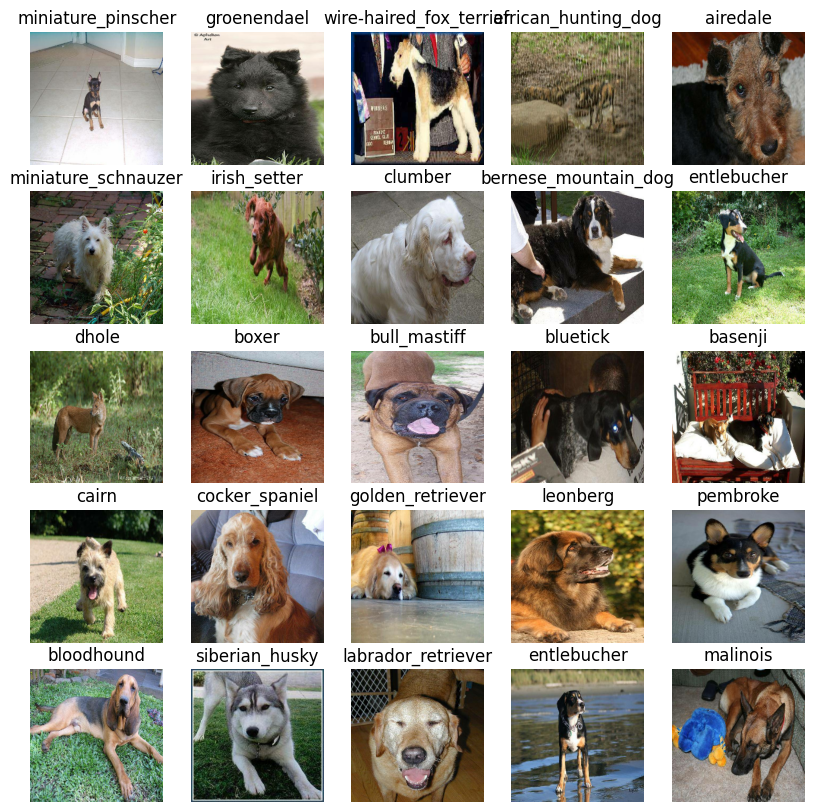

In [42]:
# Visualize the data in a training batch
show_25_images(train_images, train_labels)

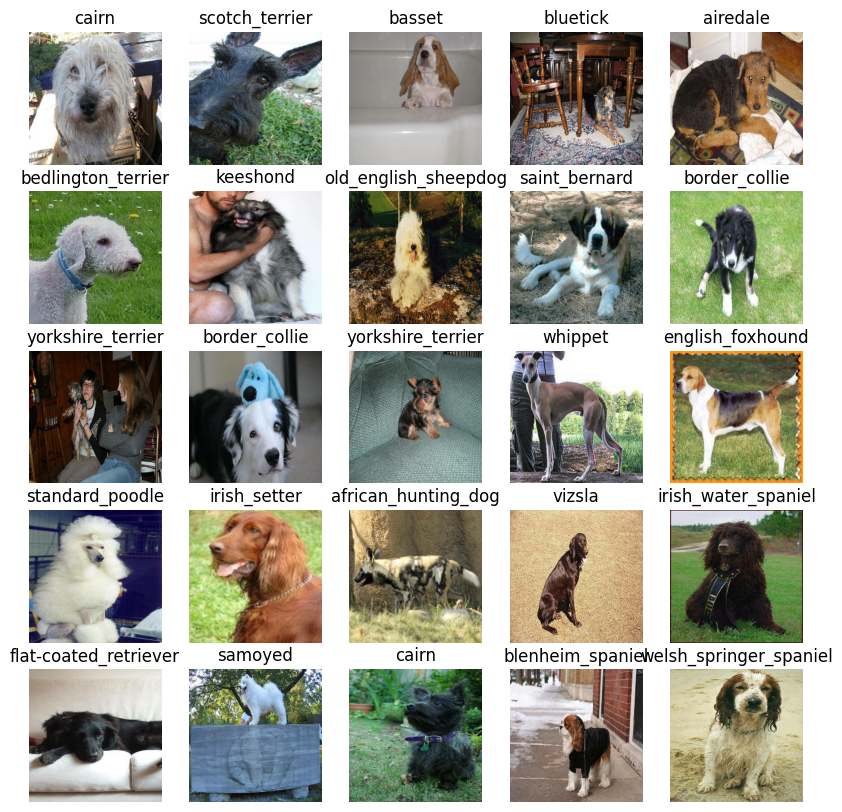

In [43]:
# Visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Few things to remember:
* The input shape (images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow hub - https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true

In [44]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour of the channel

# Setup output shape of the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true"

Input, Output and Model into Keras Deep Learning Model.

A function:

* Takes the input shape, output shape and the model we've choosen as parameters
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tell the model input shape it'll be getting)
* Returns the model.

All of these steps can be found here: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2

In [45]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [46]:
model = create_model()
model.summary()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating Callbacks

Callbacks are helper function a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

Create two callbacks, one for TensorBoard which helps track our models progess and another for early stopping which prevents our model from training for too long.

## TensorBoard Callback

To setup a TensorBoard callback, 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit `fit()` function. ✅
3. Visualize our models training logs with the %tensorboard magic function (After model training)

In [47]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [48]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Projects/dog-vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

## Early Stopping Callback

Early stopping helps stop our model from overfitting by stop training if a certain evaluation metric stops improving.

https://keras.io/api/callbacks/early_stopping/

In [49]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a Model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [50]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [51]:
# Check to make sure we're still running a GPU
print("GPU", "Available (YESS!!!)" if tf.config.list_physical_devices("GPU") else "Not Available :(")

GPU Available (YESS!!!)


Function that creates a model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks we'd like to use
* Return the model

In [52]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the model
  return model

In [53]:
# Fit the model to the data
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true
Epoch 1/100
25/25 [==============================] - 333s 13s/step - loss: 4.5660 - accuracy: 0.1125 - val_loss: 3.3924 - val_accuracy: 0.2850
Epoch 2/100
25/25 [==============================] - 5s 204ms/step - loss: 1.6442 - accuracy: 0.6725 - val_loss: 2.1879 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 4s 151ms/step - loss: 0.5786 - accuracy: 0.9262 - val_loss: 1.7024 - val_accuracy: 0.6000
Epoch 4/100
25/25 [==============================] - 4s 154ms/step - loss: 0.2597 - accuracy: 0.9825 - val_loss: 1.5279 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 5s 196ms/step - loss: 0.1509 - accuracy: 0.9937 - val_loss: 1.4354 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 144ms/step - loss: 0.1023 - accuracy: 0.9987 - val_loss: 1.3909 - val_

Looks like our model is overfitting because it's working far better on the training dataset than the validation dataset

#### How to avoid or pretend `Overfitting`

### Checking the TensorBoard logs

The tensorboard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize it's contents

In [54]:
%tensorboard --logdir drive/MyDrive/Projects/dog-vision/logs

<IPython.core.display.Javascript object>

## Making and Evaluating predictions using a trained model

In [55]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 104ms/step


array([[2.65258993e-03, 5.46447227e-05, 7.95753847e-04, ...,
        4.56983660e-04, 5.03897791e-05, 5.05157514e-03],
       [2.12259404e-03, 7.31253356e-04, 4.53898078e-03, ...,
        6.15352881e-04, 2.97726743e-04, 4.86582976e-05],
       [1.28143492e-05, 7.69730650e-06, 4.81412872e-06, ...,
        1.44535798e-05, 1.64604789e-05, 3.54768345e-05],
       ...,
       [1.36294113e-06, 5.61181078e-05, 2.11264141e-05, ...,
        1.55687139e-05, 1.43902565e-04, 3.12251534e-04],
       [1.76528480e-03, 3.00771673e-04, 1.16432202e-04, ...,
        9.82297424e-05, 3.99204182e-05, 4.68247943e-03],
       [1.04064275e-04, 1.32430523e-05, 2.44156667e-03, ...,
        1.11380301e-03, 6.22102991e-04, 1.09658367e-05]], dtype=float32)

In [57]:
np.sum(predictions[0])

1.0

In [58]:
# First Prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[1.52070468e-04 9.56227363e-04 1.18589751e-05 7.36997099e-05
 2.48168339e-03 2.00223403e-05 7.44413119e-04 2.54590856e-03
 8.76134448e-03 3.53487805e-02 8.40482826e-05 4.16914372e-05
 7.27435516e-04 5.34691662e-03 1.35848660e-03 1.23425911e-03
 8.32678052e-06 7.12050707e-04 1.30365472e-04 9.74116381e-04
 9.91013803e-05 5.57289517e-04 8.38773267e-05 1.75430439e-04
 8.53753556e-03 3.31838353e-04 6.54275864e-05 1.92350795e-04
 4.65439545e-04 6.09813796e-05 1.61707372e-04 7.55270667e-05
 3.37394362e-04 8.11735808e-05 2.28236822e-05 4.56902380e-05
 3.27660149e-04 3.06755048e-03 3.22564592e-04 2.34805509e-01
 1.57799412e-04 3.93417249e-05 1.67109957e-03 1.52836456e-05
 1.16146235e-04 3.41160412e-05 1.40670367e-04 2.78600521e-04
 3.47159694e-05 4.11312591e-04 1.46909297e-04 5.55847364e-05
 5.08274650e-04 1.65657839e-03 1.05004901e-05 2.74921622e-04
 1.92648949e-04 9.37665609e-05 3.39464954e-04 2.86010854e-05
 3.33145581e-05 1.85463857e-03 1.56478327e-05 7.05750936e-05
 8.11422360e-05 1.406442

It would be better if we could see the image the prediction is being made on

We want this to do at scale

**Note:** Prediction Probabibilities are also known as confidence levels

In [59]:
# Turn prediction probability into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabibilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabibilities
pred_label = get_pred_label(predictions[73])
pred_label

'papillon'

Since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those prediction to the validation labels (truth labels)

In [60]:
val_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Take a batched dataset of (image, label) Tensors and returns separate arrays of images and labels
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now, We got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabibilities, an array of truth labels and an array of images an integers.
* Convert the prediction probabilites to a predicted label.
* Plot the predicted label, it's predicted probabibility, the truth label and the target image on a single plot.  

In [62]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probabilty of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

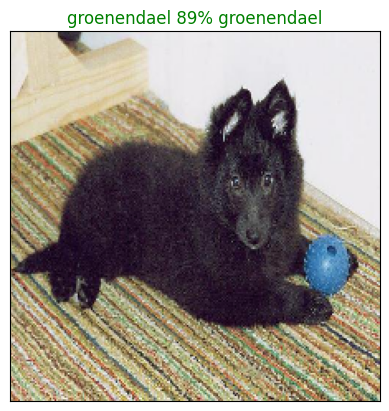

In [63]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Predicting and Visualizing our model top 10 predictions

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer
* Find the prediction using `get_pred_label()`
* Find the top 10:
  * Prediction Probabilities indexes
  * Prediction Probabilities values
  * Prediction labels

* Plot the top 10 prediction probability values and labels, coloring the true label green

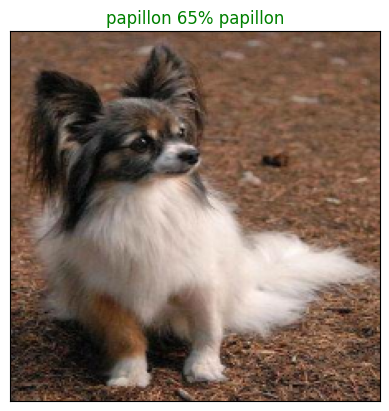

In [64]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=73)

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

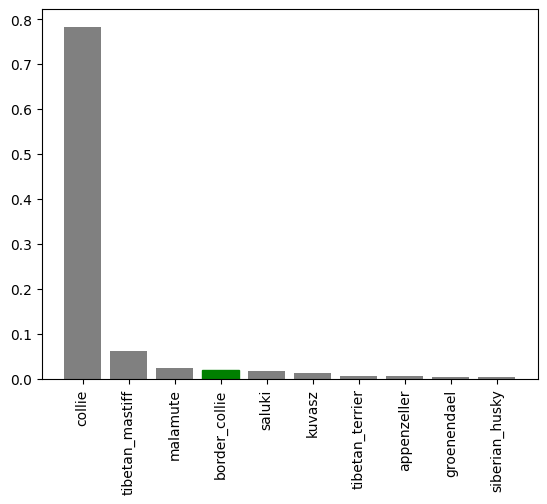

In [66]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

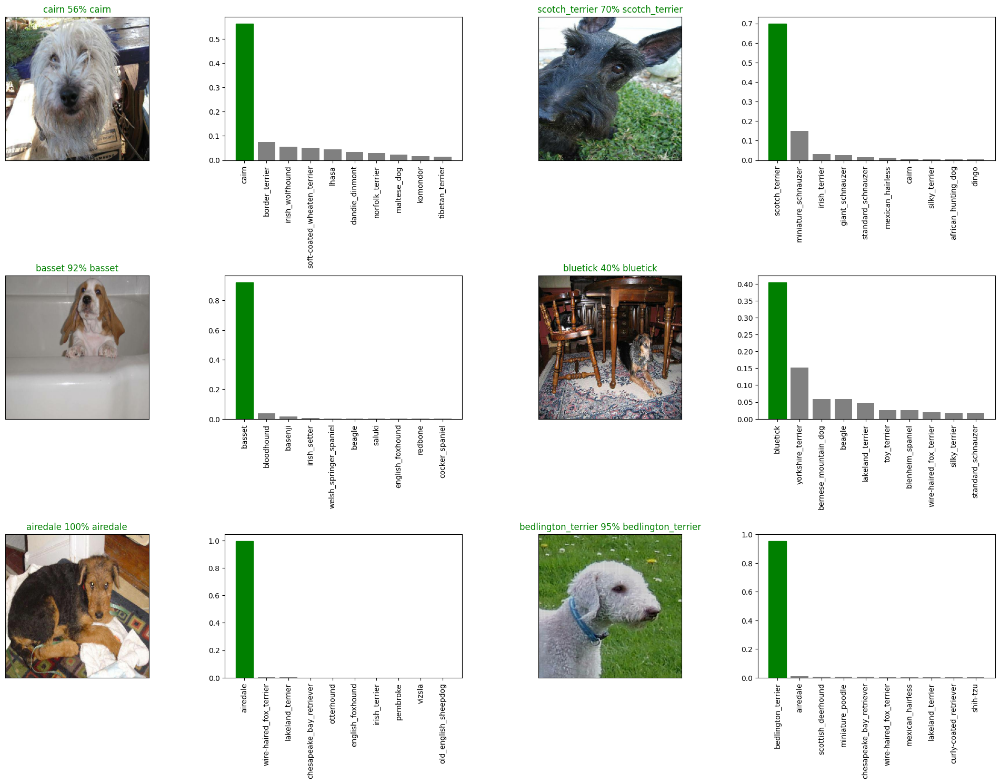

In [67]:
# Let's checkout few predictions and their different values
i_multiplier = 0
num_rows= 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

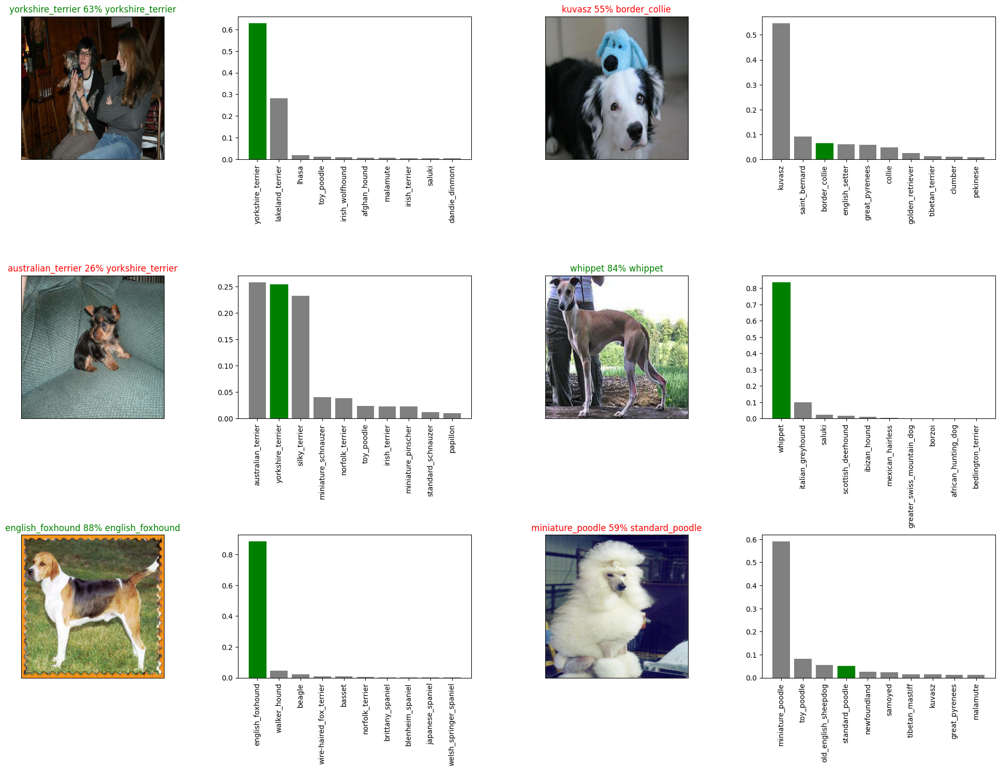

In [68]:
# Let's checkout few predictions and their different values
i_multiplier = 10
num_rows= 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [69]:
# create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string)
  """
  # Create a model directory path name with current time
  modeldir = os.path.join("drive/MyDrive/Projects/dog-vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [70]:
# create a function to load a model
def load_model(model_path):
  """
  Load a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we make sure our functions of save and load model works

In [71]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")


Saving model to: drive/MyDrive/Projects/dog-vision/models/20240317-11261710674796-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Projects/dog-vision/models/20240317-11261710674796-1000-images-mobilenetv2-Adam.h5'

In [72]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Projects/dog-vision/models/20240316-11381710589131-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Projects/dog-vision/models/20240316-11381710589131-1000-images-mobilenetv2-Adam.h5


In [73]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 155ms/step - loss: 1.2629 - accuracy: 0.6750


[1.2628765106201172, 0.675000011920929]

In [74]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 106ms/step - loss: 1.3154 - accuracy: 0.6200


[1.3154425621032715, 0.6200000047683716]

## Training a big dog model (on the full data)

In [75]:
len(X), len(y)

(10222, 10222)

In [76]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)


Creating training data batches...


In [77]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [78]:
# Create a model for full model
full_model = create_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/frameworks/tensorFlow2/variations/130-224-classification/versions/1?tfhub-redirect=true


In [79]:
# Create a full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

`Note` Running a cell below will take a while maybe upto 30 minutes

In [80]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 49s 141ms/step - loss: 1.3481 - accuracy: 0.6713
Epoch 2/100
320/320 [==============================] - 59s 183ms/step - loss: 0.4093 - accuracy: 0.8771
Epoch 3/100
320/320 [==============================] - 55s 173ms/step - loss: 0.2379 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 47s 145ms/step - loss: 0.1569 - accuracy: 0.9627
Epoch 5/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1058 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0794 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0599 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 51s 158ms/step - loss: 0.0464 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 46s 145ms/step - loss: 0.0377 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 52s 162m

In [81]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Projects/dog-vision/models/20240317-11521710676351-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Projects/dog-vision/models/20240317-11521710676351-full-image-set-mobilenetv2-Adam.h5'

In [82]:
# Load in the full model
loaded_full_model = load_model("drive/MyDrive/Projects/dog-vision/models/20240316-12501710593411-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Projects/dog-vision/models/20240316-12501710593411-full-image-set-mobilenetv2-Adam.h5


# Making predictions on the test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, We'll need them in the same format.

We have created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor Batches.

To make predictions on the test data, we'll:

* Get the test images filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [83]:
# Load test image filenames
test_path = "drive/MyDrive/Projects/dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Projects/dog-vision/test/ef1710d5cb79a5e0b46f7b9a101a25b4.jpg',
 'drive/MyDrive/Projects/dog-vision/test/ec43ece68ea32270d307242d220bea17.jpg',
 'drive/MyDrive/Projects/dog-vision/test/f372b595f5e684d8c7c261d6b0166736.jpg',
 'drive/MyDrive/Projects/dog-vision/test/ecd186a42dd0ec3f78aa3d4fa56b8ea0.jpg',
 'drive/MyDrive/Projects/dog-vision/test/e816f0027a2c6348dbf12b79c70541bc.jpg',
 'drive/MyDrive/Projects/dog-vision/test/ee4c8303084840f4fa8ef6cc434dca91.jpg',
 'drive/MyDrive/Projects/dog-vision/test/f3d5aa14bae0561b6b9146d7e7fa0917.jpg',
 'drive/MyDrive/Projects/dog-vision/test/eb06356375888d41903fff14ef7c4104.jpg',
 'drive/MyDrive/Projects/dog-vision/test/ed67035dba2de274aa95556038113c40.jpg',
 'drive/MyDrive/Projects/dog-vision/test/f4db24d71e6f3100614eb4543f98394f.jpg']

In [83]:
len(test_filenames)

In [84]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [85]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run about 1 hour or so.

In [86]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 302s 913ms/step


In [87]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Projects/dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [88]:
# Load predictions (NumPy array) from a csv file
test_predictions = np.loadtxt("drive/MyDrive/Projects/dog-vision/preds_array.csv", delimiter=",")

In [89]:
test_predictions[:10]

array([[8.90815599e-09, 1.02363038e-06, 8.09793343e-10, ...,
        2.85780679e-08, 1.58868144e-11, 3.82221546e-11],
       [1.33471376e-11, 1.29595690e-09, 3.17102768e-12, ...,
        6.59022056e-12, 1.22407418e-10, 5.80912297e-11],
       [1.60757752e-09, 5.39051052e-12, 3.83044860e-13, ...,
        4.33280561e-14, 2.74850737e-12, 3.96338956e-15],
       ...,
       [7.76831988e-10, 4.60018018e-05, 3.76859351e-13, ...,
        1.61799190e-13, 3.09361592e-10, 2.89910822e-04],
       [1.18272453e-07, 2.73864553e-03, 6.86216083e-07, ...,
        3.35457516e-05, 7.45473313e-04, 1.55466068e-07],
       [5.63113141e-13, 4.93441246e-14, 2.35444064e-09, ...,
        5.02914048e-08, 3.26597039e-12, 3.77708559e-11]])

In [90]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions to Kaggle

By looking at the kaggle submission, It wants our model predictions probability outputs in a dataframe with an ID and a column for each different dog breed.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns.
* Export the DataFrame as CSV and submit it to Kaggle.


In [91]:
# ["id"] + list(unique_breeds)

In [92]:
# Create a pandas DataFrame with an empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()



,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [93]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [94]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ef1710d5cb79a5e0b46f7b9a101a25b4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ec43ece68ea32270d307242d220bea17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f372b595f5e684d8c7c261d6b0166736,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ecd186a42dd0ec3f78aa3d4fa56b8ea0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e816f0027a2c6348dbf12b79c70541bc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [95]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ef1710d5cb79a5e0b46f7b9a101a25b4,8.908156e-09,1.023630e-06,8.097933e-10,1.876253e-07,5.636251e-16,1.067828e-07,9.955211e-07,1.292869e-14,3.001297e-12,...,5.888530e-12,1.423504e-11,1.093487e-10,1.422937e-10,2.799592e-13,4.037653e-13,1.375512e-13,2.857807e-08,1.588681e-11,3.822215e-11
1,ec43ece68ea32270d307242d220bea17,1.334714e-11,1.295957e-09,3.171028e-12,8.785942e-14,1.773230e-12,1.828456e-10,1.998411e-10,1.618753e-07,1.835997e-14,...,3.978913e-13,4.749971e-09,7.577990e-13,1.383575e-10,1.490958e-08,5.904278e-13,9.543698e-09,6.590221e-12,1.224074e-10,5.809123e-11
2,f372b595f5e684d8c7c261d6b0166736,1.607578e-09,5.390511e-12,3.830449e-13,8.471919e-14,1.390315e-07,1.111450e-13,5.535938e-12,2.334808e-13,1.284127e-08,...,1.051833e-12,5.415184e-11,1.842612e-12,2.474322e-09,2.306854e-13,7.627516e-12,4.002459e-04,4.332806e-14,2.748507e-12,3.963390e-15
3,ecd186a42dd0ec3f78aa3d4fa56b8ea0,3.172826e-12,4.391763e-11,2.498521e-15,8.214704e-09,1.874726e-17,9.686921e-19,5.325532e-14,1.130677e-18,2.435621e-15,...,2.203464e-16,3.169334e-17,1.801293e-15,8.209820e-16,7.441545e-18,3.003492e-18,2.802478e-19,1.569151e-15,2.639640e-10,2.327809e-14
4,e816f0027a2c6348dbf12b79c70541bc,2.755554e-11,4.145996e-13,8.592038e-17,5.385879e-15,6.311735e-16,3.495276e-21,6.660733e-21,2.714555e-20,2.333795e-16,...,5.546632e-17,1.836748e-17,3.715158e-20,1.774216e-19,1.058140e-19,8.722846e-14,1.021330e-10,3.614843e-17,2.393060e-13,5.766051e-15


In [96]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Projects/dog-vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction labels.
* Compare the predicted labels to the custom images.
